# Funções

In [1]:
import os
import time
import copy
import torch
import torchvision
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import segmentation_models_pytorch as smp
from segmentation_models_pytorch.encoders import get_preprocessing_fn
import matplotlib.pyplot as plt

import numpy as np
from PIL import Image

from sklearn.metrics import jaccard_score
from medpy.metric.binary import hd, asd 

import ssl

/home/tivo/TI0160-VisaoComputacionalAplicadaASaude-UFC-2024.1/env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
torch.cuda.empty_cache()

In [3]:
ssl._create_default_https_context = ssl._create_unverified_context

PATCH_SIZE = (256, 256)
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
BATCH_SIZE = 16
N_EPOCHS = 50
N_WORKERS = 10
MODELS_PATH = "models/segmentation_metrics"

In [4]:
class DatasetBreastCancer(Dataset):
    def __init__(self, image_paths, mask_paths):
        """
        image_paths: Lista de caminhos das imagens.
        mask_paths: Lista de caminhos das máscaras correspondentes.
        """
        self.transform = torchvision.transforms.Compose(
            [
                torchvision.transforms.Resize(PATCH_SIZE),
                torchvision.transforms.ToTensor(),
            ]
        )
        self.image_paths = image_paths
        self.mask_paths = mask_paths


    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]

        # Carrega a imagem e a máscara
        image = Image.open(img_path).convert('L')
        mask = Image.open(mask_path).convert('L')

        image = self.transform(image)
        mask = self.transform(mask)

        return image, mask

In [5]:
import os
from sklearn.model_selection import train_test_split

base_dir = '../DATA/raw'
categories = ['benign', 'malignant']

train_image_paths = []
val_image_paths = []
test_image_paths = []
train_mask_paths = []
val_mask_paths = []
test_mask_paths = []

for category in categories:
    category_dir = os.path.join(base_dir, category)
    category_image_paths = []
    category_mask_paths = []
    
    image_fnames = sorted([fname for fname in os.listdir(category_dir) if not fname.endswith('_mask.png')])
    mask_fnames = [fname for fname in os.listdir(category_dir) if fname.endswith('_mask.png')]
    
    for fname in image_fnames:
        category_image_paths.append(os.path.join(category_dir, fname))
        category_mask_paths.append(os.path.join(category_dir, fname.replace('.png', '_mask.png')))
    
    for fname in mask_fnames:
        if os.path.join(category_dir, fname) not in category_mask_paths:
            category_mask_paths.append(os.path.join(category_dir, fname))
    
    # Dividir os caminhos em conjuntos de treino e validação para cada categoria
    train_img, temp_image_paths, train_mask, temp_mask_paths = train_test_split(
        category_image_paths, category_mask_paths, test_size=0.3, random_state=42
    )
    val_img, test_img, val_mask, test_mask = train_test_split(
        temp_image_paths, temp_mask_paths, test_size=0.5, random_state=42
    )
    
    train_image_paths.extend(train_img)
    val_image_paths.extend(val_img)
    test_image_paths.extend(test_img)
    train_mask_paths.extend(train_mask)
    val_mask_paths.extend(val_mask)
    test_mask_paths.extend(test_mask)

In [6]:
train_dataset = DatasetBreastCancer(train_image_paths, train_mask_paths)
val_dataset = DatasetBreastCancer(val_image_paths, val_mask_paths)
test_dataset = DatasetBreastCancer(test_image_paths, test_mask_paths)

In [7]:
def train(model, train_loader, val_loader, loss_fn, optimizer, n_epochs, patience=10):
    best_loss = float('inf')
    best_model_wts = copy.deepcopy(model.state_dict())
    epochs_no_improve = 0

    train_losses = []
    val_losses = []

    for epoch in range(n_epochs):
        running_loss = 0.0
        val_loss = 0.0

        # Treinamento
        model.train()
        for images, masks in train_loader:
            images = images.to(DEVICE)
            masks = masks.to(DEVICE)

            optimizer.zero_grad()
            outputs = model(images)
            
            loss = loss_fn(outputs, masks)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        # Validação
        model.eval()
        with torch.no_grad():
            for images, masks in val_loader:
                images = images.to(DEVICE)
                masks = masks.to(DEVICE)  # Removido .unsqueeze(1)

                outputs = model(images)
                loss = loss_fn(outputs, masks)
                val_loss += loss.item()

        epoch_loss = running_loss / len(train_loader)
        epoch_val_loss = val_loss / len(val_loader)

        train_losses.append(epoch_loss)
        val_losses.append(epoch_val_loss)

        print(f'Época {epoch+1}/{n_epochs} / Loss: {epoch_loss:.4f} / Val Loss: {epoch_val_loss:.4f}')

        # Verificar melhora no loss de validação
        if epoch_val_loss < best_loss:
            best_loss = epoch_val_loss
            best_model_wts = copy.deepcopy(model.state_dict())
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print(f'Early stopping após {epoch+1} épocas.')
                break

    # Plotar Loss e Val Loss
    epochs_range = range(1, len(train_losses)+1)
    plt.plot(epochs_range, train_losses, label='Loss de Treinamento')
    plt.plot(epochs_range, val_losses, label='Loss de Validação')
    plt.xlabel('Épocas')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

In [8]:
import torch
from scipy.spatial.distance import directed_hausdorff


def balanced_average_hausdorff_distance(predictions: torch.Tensor, targets: torch.Tensor) -> torch.Tensor:
    """
    Calculates the balanced average Hausdorff distance between predictions and targets.

    Parameters:
        predictions (torch.Tensor):
            The predicted tensor.
        targets (torch.Tensor):
            The target tensor.

    Returns:
        torch.Tensor:
            The balanced average Hausdorff distance.
    """

    batch_size, channels, *_ = targets.shape
    values = torch.zeros((batch_size, channels))

    for batch in range(batch_size):
        for channel in range(channels):
            targets_, predictions_ = (
                targets[batch][channel].detach().cpu(),
                predictions[batch][channel].detach().cpu(),
            )
            values[batch, channel] = (
                directed_hausdorff(targets_, predictions_)[0]
                + directed_hausdorff(predictions_, targets_)[0]
                * predictions_.view(1, -1).size(1)
                / targets_.view(1, -1).size(1)
            ) / 2

    return values.mean()

In [9]:
import torch
from medpy.metric.binary import asd
import numpy as np


def handle_empty_array(array: np.ndarray) -> np.ndarray:
    """
    Handle empty arrays by filling them with a default value if they contain only zeros.

    Args:
        array (np.ndarray):
            Input array.

    Returns:
        np.ndarray:
            Array with zeros replaced by a default value if the array was empty.
    """

    if np.count_nonzero(array) == 0:
        array[0, 0] = 1

    return array


def average_surface_distance(
    predictions: torch.Tensor, targets: torch.Tensor, threshold: float = 0.5, connectivity: int = 1
) -> torch.Tensor:
    """
    Calculates the average surface distance between two binary segmentation masks.

    Parameters:
        predictions (torch.Tensor):
            The first binary segmentation mask tensor.
        targets (torch.Tensor):
            The second binary segmentation mask tensor.
        threshold (float, optional):
            Threshold value to convert predictions to binary. Defaults to 0.5.

    Returns:
        torch.Tensor:
            The average surface distance.
    """

    predictions_, targets_ = (predictions > threshold).detach().cpu().numpy(), targets.detach().cpu().numpy()

    predictions_, targets_ = handle_empty_array(predictions_), handle_empty_array(targets_)

    return asd(predictions_, targets_)

In [10]:
import torch


def jaccard_index(predictions: torch.Tensor, targets: torch.Tensor, threshold: float = 0.5) -> torch.Tensor:
    """
    Calculates the Jaccard Index metric for a batch of predictions.

    Parameters:
        predictions (torch.Tensor):
            The predicted tensor.
        targets (torch.Tensor):
            The target tensor.
        threshold (float):
            The threshold above which predictions are considered positive. Defaults to 0.5.

    Returns:
        torch.Tensor:
            The Jaccard Index value.
    """

    predictions_, targets_ = predictions.view(predictions.size(0), -1), targets.view(targets.size(0), -1)

    y_pred_positive = torch.round((predictions_ > threshold).int())
    y_pred_negative = 1 - y_pred_positive

    y_positive = torch.round(torch.clip(targets_, 0, 1))
    y_negative = 1 - y_positive

    TP = (y_positive * y_pred_positive).sum(dim=1)
    _ = (y_negative * y_pred_negative).sum(dim=1)

    FP = (y_negative * y_pred_positive).sum(dim=1)
    FN = (y_positive * y_pred_negative).sum(dim=1)

    return ((TP) / (TP + FP + FN)).mean()

In [11]:
import torch


def dice(predictions: torch.Tensor, targets: torch.Tensor, threshold: float = 0.5) -> torch.Tensor:
    """
    Calculates the Dice score metric for a batch of predictions.

    Parameters:
        predictions (torch.Tensor):
            The predicted tensor.
        targets (torch.Tensor):
            The target tensor.
        threshold (float):
            The threshold above which predictions are considered positive. Defaults to 0.5.

    Returns:
        torch.Tensor:
            The Dice score value.
    """

    predictions_, targets_ = predictions.view(predictions.size(0), -1), targets.view(targets.size(0), -1)

    y_pred_positive = torch.round((predictions_ > threshold).int())
    y_pred_negative = 1 - y_pred_positive

    y_positive = torch.round(torch.clip(targets_, 0, 1))
    y_negative = 1 - y_positive

    TP = (y_positive * y_pred_positive).sum(dim=1)
    _ = (y_negative * y_pred_negative).sum(dim=1)

    FP = (y_negative * y_pred_positive).sum(dim=1)
    FN = (y_positive * y_pred_negative).sum(dim=1)

    return ((2 * TP) / (2 * TP + FP + FN)).mean()

In [12]:
def evaluate(model, loader):
    """
    Avalia o modelo utilizando as funções de métrica disponíveis.

    Parâmetros:
        model (torch.nn.Module): O modelo treinado a ser avaliado.
        loader (torch.utils.data.DataLoader): DataLoader para o conjunto de dados de avaliação.

    Retorna:
        dict: Um dicionário contendo as médias das métricas avaliadas.
    """
    model.eval()
    dice_scores = []
    jaccard_scores = []
    hausdorff_distances = []
    avg_surface_distances = []
    times = []

    with torch.no_grad():
        for images, masks in loader:
            images = images.to(DEVICE)
            masks = masks.to(DEVICE)

            start_time = time.time()
            outputs = model(images)
            end_time = time.time()

            preds = torch.sigmoid(outputs)

            for i in range(images.size(0)):
                pred = preds[i].cpu()
                mask = masks[i].cpu()

                # Utiliza as funções de métrica definidas anteriormente
                dice_coefficient = dice(pred, mask)
                dice_scores.append(dice_coefficient)

                jaccard = jaccard_index(pred, mask)
                jaccard_scores.append(jaccard)

                hausdorff = balanced_average_hausdorff_distance(pred.unsqueeze(0), mask.unsqueeze(0))
                hausdorff_distances.append(hausdorff.item())

                avg_surf_dist = average_surface_distance(pred.unsqueeze(0).float(), mask.unsqueeze(0).float())
                avg_surface_distances.append(avg_surf_dist.item())

            times.append(end_time - start_time)

    # Calcula a média das métricas
    avg_dice = np.mean(dice_scores)
    avg_jaccard = np.mean(jaccard_scores)
    avg_hausdorff = np.mean(hausdorff_distances)
    avg_asd = np.mean(avg_surface_distances)
    total_time = np.mean(times)
    
    return {
        "Mean Dice Coefficient": avg_dice,
        "Mean Jaccard Index": avg_jaccard,
        "Mean Hausdorff Distance": avg_hausdorff,
        "Mean Average Surface Distance": avg_asd,
        "Processing Time (s)": total_time
    }

In [13]:
def save_model(model, path):
    torch.save(model.state_dict(), path)

In [14]:
def dice_loss(predictions: torch.Tensor, targets: torch.Tensor, epsilon=1e-6) -> torch.Tensor:
    predictions = torch.sigmoid(predictions)
    predictions = predictions.contiguous().view(-1)
    targets = targets.contiguous().view(-1)

    intersection = (predictions * targets).sum()
    union = predictions.sum() + targets.sum()

    loss = 1 - (2. * intersection + epsilon) / (union + epsilon)
    return loss

def jaccard_loss(predictions: torch.Tensor, targets: torch.Tensor, epsilon=1e-6) -> torch.Tensor:
    predictions = torch.sigmoid(predictions)  # Adicionado: Aplicação da função sigmoide
    predictions = predictions.contiguous().view(-1)
    targets = targets.contiguous().view(-1)

    intersection = (predictions * targets).sum()
    union = predictions.sum() + targets.sum() - intersection

    loss = 1 - (intersection + epsilon) / (union + epsilon)
    return loss

In [15]:
loss_functions = {
    "DiceLoss": dice_loss,
    "JaccardLoss": jaccard_loss
}

# Encoder: Densenet201 / Decoder: UNET

Treinando modelo com DiceLoss...
Época 1/50 / Loss: 0.7485 / Val Loss: 0.8003
Época 2/50 / Loss: 0.6808 / Val Loss: 0.7603
Época 3/50 / Loss: 0.6508 / Val Loss: 0.7438
Época 4/50 / Loss: 0.6259 / Val Loss: 0.7442
Época 5/50 / Loss: 0.6017 / Val Loss: 0.7192
Época 6/50 / Loss: 0.5878 / Val Loss: 0.7228
Época 7/50 / Loss: 0.5496 / Val Loss: 0.6928
Época 8/50 / Loss: 0.5346 / Val Loss: 0.6684
Época 9/50 / Loss: 0.4966 / Val Loss: 0.6518
Época 10/50 / Loss: 0.4725 / Val Loss: 0.6467
Época 11/50 / Loss: 0.4414 / Val Loss: 0.6403
Época 12/50 / Loss: 0.4183 / Val Loss: 0.6158
Época 13/50 / Loss: 0.3944 / Val Loss: 0.5795
Época 14/50 / Loss: 0.3628 / Val Loss: 0.5937
Época 15/50 / Loss: 0.3431 / Val Loss: 0.5850
Época 16/50 / Loss: 0.3178 / Val Loss: 0.5364
Época 17/50 / Loss: 0.2856 / Val Loss: 0.5461
Época 18/50 / Loss: 0.2713 / Val Loss: 0.5294
Época 19/50 / Loss: 0.2385 / Val Loss: 0.4978
Época 20/50 / Loss: 0.2198 / Val Loss: 0.4812
Época 21/50 / Loss: 0.1861 / Val Loss: 0.4657
Época 22/5

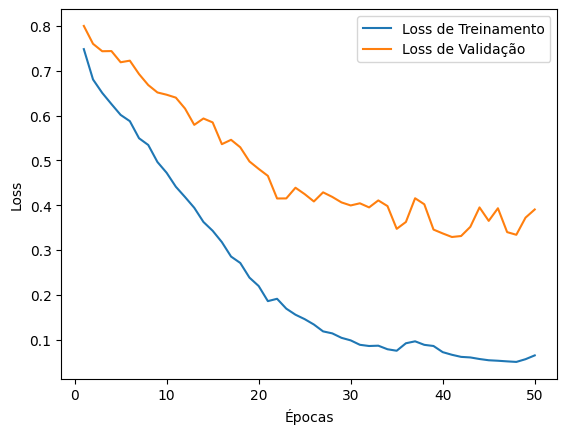

Modelo treinado!

Métricas de avaliação para DiceLoss:
	Mean Dice Coefficient: 0.7403
	Mean Jaccard Index: 0.6496
	Mean Hausdorff Distance: 4.1313
	Mean Average Surface Distance: 6.3496
	Processing Time (s): 0.0592
Treinando modelo com JaccardLoss...
Época 1/50 / Loss: 0.8603 / Val Loss: 0.8909
Época 2/50 / Loss: 0.8146 / Val Loss: 0.8729
Época 3/50 / Loss: 0.7847 / Val Loss: 0.8554
Época 4/50 / Loss: 0.7653 / Val Loss: 0.8442
Época 5/50 / Loss: 0.7470 / Val Loss: 0.8365
Época 6/50 / Loss: 0.7241 / Val Loss: 0.8300
Época 7/50 / Loss: 0.7073 / Val Loss: 0.8215
Época 8/50 / Loss: 0.6840 / Val Loss: 0.8041
Época 9/50 / Loss: 0.6509 / Val Loss: 0.7889
Época 10/50 / Loss: 0.6156 / Val Loss: 0.7779
Época 11/50 / Loss: 0.5787 / Val Loss: 0.7668
Época 12/50 / Loss: 0.5507 / Val Loss: 0.7522
Época 13/50 / Loss: 0.5065 / Val Loss: 0.7011
Época 14/50 / Loss: 0.4889 / Val Loss: 0.6909
Época 15/50 / Loss: 0.4439 / Val Loss: 0.6812
Época 16/50 / Loss: 0.4128 / Val Loss: 0.6634
Época 17/50 / Loss: 0.

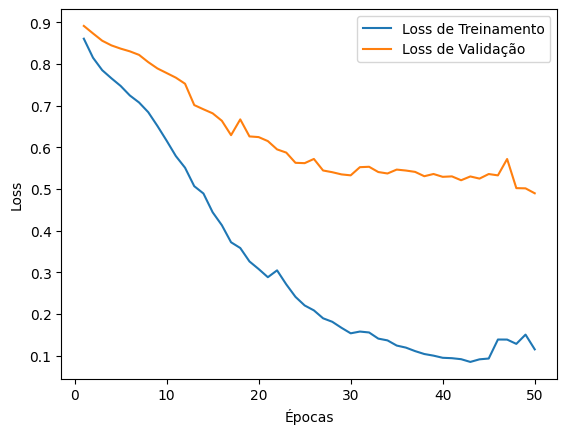

Modelo treinado!

Métricas de avaliação para JaccardLoss:
	Mean Dice Coefficient: 0.7773
	Mean Jaccard Index: 0.6924
	Mean Hausdorff Distance: 4.1106
	Mean Average Surface Distance: 7.9565
	Processing Time (s): 0.0510


In [32]:
preprocess_input = get_preprocessing_fn('densenet201', pretrained='imagenet')

for loss_name, loss_fn in loss_functions.items():
    print(f"Treinando modelo com {loss_name}...")
    
    # Inicializa o modelo
    model = smp.Unet(
        encoder_name="densenet201",
        encoder_weights="imagenet",
        in_channels=1,
        classes=1,
    ).to(DEVICE)
    
    # Inicializa o otimizador
    optimizer = optim.Adam(model.parameters(), lr=1e-4)
    
    # Define o caminho para salvar o modelo
    model_path = os.path.join(MODELS_PATH, f"densenet201_unet_{loss_name.lower()}_model.pth")
    
    if os.path.exists(model_path):
        model.load_state_dict(torch.load(model_path))
        print("Modelo carregado!")
    else:
        # Define os data loaders
        train_loader = DataLoader(
            train_dataset,
            batch_size=BATCH_SIZE,
            pin_memory=True,
            shuffle=True,
            drop_last=False,
            num_workers=N_WORKERS
        )
    
        val_loader = DataLoader(
            val_dataset,
            batch_size=BATCH_SIZE,
            pin_memory=True,
            shuffle=False,
            drop_last=False,
            num_workers=N_WORKERS
        )
        
        # Treina o modelo
        train(model, train_loader, val_loader, loss_fn, optimizer, N_EPOCHS)
        
        # Salva o modelo treinado
        save_model(model, model_path)
        print("Modelo treinado!")
    
    # Carrega o data loader de teste
    test_loader = DataLoader(
        test_dataset,
        batch_size=BATCH_SIZE,
        pin_memory=True,
        shuffle=False,
        drop_last=False,
        num_workers=N_WORKERS
    )
    
    # Avalia o modelo
    metrics = evaluate(model, test_loader)
    print(f"\nMétricas de avaliação para {loss_name}:")
    for metric, value in metrics.items():
        print(f"\t{metric}: {value:.4f}")


# Encoder: Resnet152 / Decoder: UNET

Treinando modelo com DiceLoss...
Época 1/50 / Loss: 0.7569 / Val Loss: 0.8007
Época 2/50 / Loss: 0.6782 / Val Loss: 0.7895
Época 3/50 / Loss: 0.6325 / Val Loss: 0.7551
Época 4/50 / Loss: 0.6034 / Val Loss: 0.7370
Época 5/50 / Loss: 0.5659 / Val Loss: 0.7169
Época 6/50 / Loss: 0.5364 / Val Loss: 0.7058
Época 7/50 / Loss: 0.5106 / Val Loss: 0.6859
Época 8/50 / Loss: 0.4902 / Val Loss: 0.6786
Época 9/50 / Loss: 0.4688 / Val Loss: 0.6696
Época 10/50 / Loss: 0.4534 / Val Loss: 0.6419
Época 11/50 / Loss: 0.4320 / Val Loss: 0.6374
Época 12/50 / Loss: 0.3906 / Val Loss: 0.6051
Época 13/50 / Loss: 0.3768 / Val Loss: 0.5935
Época 14/50 / Loss: 0.3553 / Val Loss: 0.5580
Época 15/50 / Loss: 0.3199 / Val Loss: 0.5741
Época 16/50 / Loss: 0.2942 / Val Loss: 0.5405
Época 17/50 / Loss: 0.2724 / Val Loss: 0.5305
Época 18/50 / Loss: 0.2649 / Val Loss: 0.5404
Época 19/50 / Loss: 0.2379 / Val Loss: 0.5201
Época 20/50 / Loss: 0.2145 / Val Loss: 0.5097
Época 21/50 / Loss: 0.2182 / Val Loss: 0.5220
Época 22/5

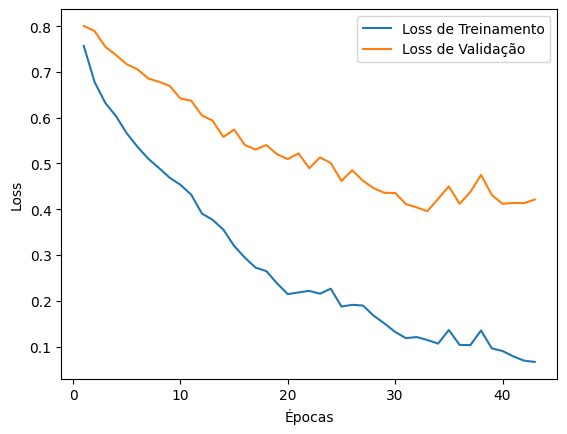

Modelo treinado!

Métricas de avaliação para DiceLoss:
	Mean Dice Coefficient: 0.7321
	Mean Jaccard Index: 0.6479
	Mean Hausdorff Distance: 4.1468
	Mean Average Surface Distance: 8.9366
	Processing Time (s): 0.0387
Treinando modelo com JaccardLoss...
Época 1/50 / Loss: 0.8592 / Val Loss: 0.8819
Época 2/50 / Loss: 0.7838 / Val Loss: 0.8603
Época 3/50 / Loss: 0.7545 / Val Loss: 0.8379
Época 4/50 / Loss: 0.7240 / Val Loss: 0.8315
Época 5/50 / Loss: 0.6866 / Val Loss: 0.8138
Época 6/50 / Loss: 0.6649 / Val Loss: 0.7882
Época 7/50 / Loss: 0.6240 / Val Loss: 0.7796
Época 8/50 / Loss: 0.6024 / Val Loss: 0.7794
Época 9/50 / Loss: 0.5699 / Val Loss: 0.7580
Época 10/50 / Loss: 0.5432 / Val Loss: 0.7352
Época 11/50 / Loss: 0.5212 / Val Loss: 0.7386
Época 12/50 / Loss: 0.4930 / Val Loss: 0.7253
Época 13/50 / Loss: 0.4636 / Val Loss: 0.7113
Época 14/50 / Loss: 0.4483 / Val Loss: 0.6864
Época 15/50 / Loss: 0.4115 / Val Loss: 0.6805
Época 16/50 / Loss: 0.3761 / Val Loss: 0.6886
Época 17/50 / Loss: 0.

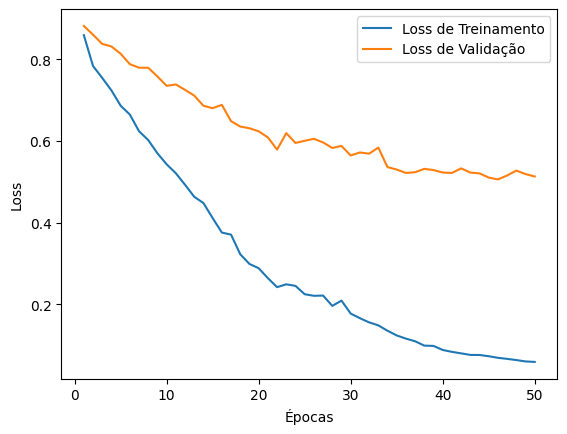

Modelo treinado!

Métricas de avaliação para JaccardLoss:
	Mean Dice Coefficient: 0.7507
	Mean Jaccard Index: 0.6705
	Mean Hausdorff Distance: 4.1689
	Mean Average Surface Distance: 9.5113
	Processing Time (s): 0.0346


In [16]:
preprocess_input = get_preprocessing_fn('resnet152', pretrained='imagenet')

# Definição das funções de perda

for loss_name, loss_fn in loss_functions.items():
    print(f"Treinando modelo com {loss_name}...")
    
    # Inicializa o modelo
    model = smp.Unet(
        encoder_name="resnet152",
        encoder_weights="imagenet",
        in_channels=1,
        classes=1,
    ).to(DEVICE)
    
    # Inicializa o otimizador
    optimizer = optim.Adam(model.parameters(), lr=1e-4)
    
    # Define o caminho para salvar o modelo
    model_path = os.path.join(MODELS_PATH, f"resnet152_unet_{loss_name.lower()}_model.pth")
    
    if os.path.exists(model_path):
        model.load_state_dict(torch.load(model_path))
        print("Modelo carregado!")
    else:
        # Define os data loaders
        train_loader = DataLoader(
            train_dataset,
            batch_size=BATCH_SIZE,
            pin_memory=True,
            shuffle=True,
            drop_last=False,
            num_workers=N_WORKERS
        )
    
        val_loader = DataLoader(
            val_dataset,
            batch_size=BATCH_SIZE,
            pin_memory=True,
            shuffle=False,
            drop_last=False,
            num_workers=N_WORKERS
        )
        
        # Treina o modelo
        train(model, train_loader, val_loader, loss_fn, optimizer, N_EPOCHS)
        
        # Salva o modelo treinado
        save_model(model, model_path)
        print("Modelo treinado!")
    
    # Carrega o data loader de teste
    test_loader = DataLoader(
        test_dataset,
        batch_size=BATCH_SIZE,
        pin_memory=True,
        shuffle=False,
        drop_last=False,
        num_workers=N_WORKERS
    )
    
    # Avalia o modelo
    metrics = evaluate(model, test_loader)
    print(f"\nMétricas de avaliação para {loss_name}:")
    for metric, value in metrics.items():
        print(f"\t{metric}: {value:.4f}")


# Encoder: MobileNetV2 / Decoder: UNET


Treinando modelo com DiceLoss...
Época 1/50 / Loss: 0.7725 / Val Loss: 0.8088
Época 2/50 / Loss: 0.6958 / Val Loss: 0.7726
Época 3/50 / Loss: 0.6384 / Val Loss: 0.7504
Época 4/50 / Loss: 0.5990 / Val Loss: 0.7246
Época 5/50 / Loss: 0.5487 / Val Loss: 0.7088
Época 6/50 / Loss: 0.5159 / Val Loss: 0.6933
Época 7/50 / Loss: 0.4800 / Val Loss: 0.6856
Época 8/50 / Loss: 0.4441 / Val Loss: 0.6456
Época 9/50 / Loss: 0.4135 / Val Loss: 0.6160
Época 10/50 / Loss: 0.3664 / Val Loss: 0.6090
Época 11/50 / Loss: 0.3364 / Val Loss: 0.5953
Época 12/50 / Loss: 0.3122 / Val Loss: 0.5824
Época 13/50 / Loss: 0.2812 / Val Loss: 0.5667
Época 14/50 / Loss: 0.2642 / Val Loss: 0.5441
Época 15/50 / Loss: 0.2522 / Val Loss: 0.5303
Época 16/50 / Loss: 0.2291 / Val Loss: 0.5149
Época 17/50 / Loss: 0.2013 / Val Loss: 0.5092
Época 18/50 / Loss: 0.1852 / Val Loss: 0.4940
Época 19/50 / Loss: 0.1700 / Val Loss: 0.4951
Época 20/50 / Loss: 0.1607 / Val Loss: 0.4805
Época 21/50 / Loss: 0.1458 / Val Loss: 0.5027
Época 22/5

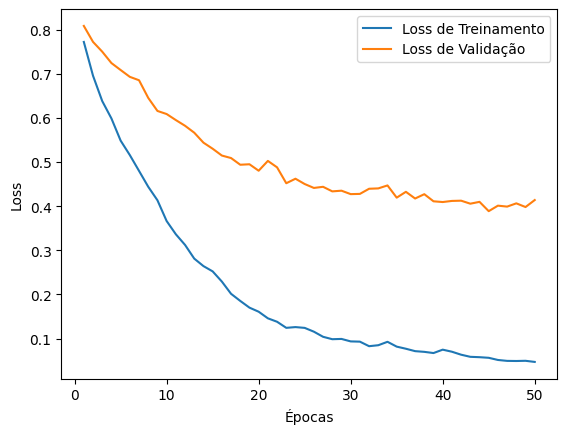

Modelo treinado!

Métricas de avaliação para DiceLoss:
	Mean Dice Coefficient: 0.7369
	Mean Jaccard Index: 0.6496
	Mean Hausdorff Distance: 4.1746
	Mean Average Surface Distance: 9.8040
	Processing Time (s): 0.0157
Treinando modelo com JaccardLoss...
Época 1/50 / Loss: 0.8636 / Val Loss: 0.8921
Época 2/50 / Loss: 0.7918 / Val Loss: 0.8596
Época 3/50 / Loss: 0.7382 / Val Loss: 0.8321
Época 4/50 / Loss: 0.6923 / Val Loss: 0.8020
Época 5/50 / Loss: 0.6647 / Val Loss: 0.7866
Época 6/50 / Loss: 0.6174 / Val Loss: 0.7673
Época 7/50 / Loss: 0.5759 / Val Loss: 0.7684
Época 8/50 / Loss: 0.5269 / Val Loss: 0.7313
Época 9/50 / Loss: 0.4843 / Val Loss: 0.6998
Época 10/50 / Loss: 0.4369 / Val Loss: 0.6726
Época 11/50 / Loss: 0.3742 / Val Loss: 0.6705
Época 12/50 / Loss: 0.3646 / Val Loss: 0.6538
Época 13/50 / Loss: 0.3235 / Val Loss: 0.6226
Época 14/50 / Loss: 0.2964 / Val Loss: 0.6324
Época 15/50 / Loss: 0.2711 / Val Loss: 0.6019
Época 16/50 / Loss: 0.2656 / Val Loss: 0.5888
Época 17/50 / Loss: 0.

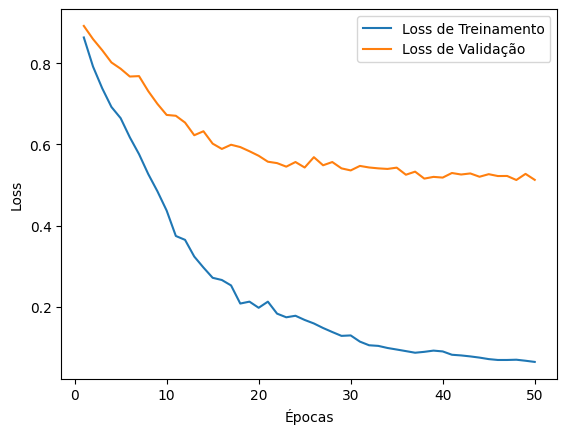

Modelo treinado!

Métricas de avaliação para JaccardLoss:
	Mean Dice Coefficient: 0.7407
	Mean Jaccard Index: 0.6488
	Mean Hausdorff Distance: 4.2656
	Mean Average Surface Distance: 7.5992
	Processing Time (s): 0.0152


In [17]:
preprocess_input = get_preprocessing_fn('mobilenet_v2', pretrained='imagenet')

for loss_name, loss_fn in loss_functions.items():
    print(f"Treinando modelo com {loss_name}...")
    
    # Inicializa o modelo
    model = smp.Unet(
        encoder_name="mobilenet_v2",
        encoder_weights="imagenet",
        in_channels=1,
        classes=1,
    ).to(DEVICE)
    
    # Inicializa o otimizador
    optimizer = optim.Adam(model.parameters(), lr=1e-4)
    
    # Define o caminho para salvar o modelo
    model_path = os.path.join(MODELS_PATH, f"mobilenet_v2_unet_{loss_name.lower()}_model.pth")
    
    if os.path.exists(model_path):
        model.load_state_dict(torch.load(model_path))
        print("Modelo carregado!")
    else:
        # Define os data loaders
        train_loader = DataLoader(
            train_dataset,
            batch_size=BATCH_SIZE,
            pin_memory=True,
            shuffle=True,
            drop_last=False,
            num_workers=N_WORKERS
        )
    
        val_loader = DataLoader(
            val_dataset,
            batch_size=BATCH_SIZE,
            pin_memory=True,
            shuffle=False,
            drop_last=False,
            num_workers=N_WORKERS
        )
        
        # Treina o modelo
        train(model, train_loader, val_loader, loss_fn, optimizer, N_EPOCHS)
        
        # Salva o modelo treinado
        save_model(model, model_path)
        print("Modelo treinado!")
    
    # Carrega o data loader de teste
    test_loader = DataLoader(
        test_dataset,
        batch_size=BATCH_SIZE,
        pin_memory=True,
        shuffle=False,
        drop_last=False,
        num_workers=N_WORKERS
    )
    
    # Avalia o modelo
    metrics = evaluate(model, test_loader)
    print(f"\nMétricas de avaliação para {loss_name}:")
    for metric, value in metrics.items():
        print(f"\t{metric}: {value:.4f}")


# Encoder: Xception / Decoder: UNET

Treinando modelo com DiceLoss...
Época 1/50 / Loss: 0.7387 / Val Loss: 0.7785
Época 2/50 / Loss: 0.6141 / Val Loss: 0.7221
Época 3/50 / Loss: 0.5377 / Val Loss: 0.6947
Época 4/50 / Loss: 0.4819 / Val Loss: 0.6605
Época 5/50 / Loss: 0.4291 / Val Loss: 0.6291
Época 6/50 / Loss: 0.3783 / Val Loss: 0.6000
Época 7/50 / Loss: 0.3283 / Val Loss: 0.5753
Época 8/50 / Loss: 0.2986 / Val Loss: 0.5446
Época 9/50 / Loss: 0.2667 / Val Loss: 0.5196
Época 10/50 / Loss: 0.2450 / Val Loss: 0.5200
Época 11/50 / Loss: 0.2087 / Val Loss: 0.4912
Época 12/50 / Loss: 0.1899 / Val Loss: 0.4798
Época 13/50 / Loss: 0.1756 / Val Loss: 0.4712
Época 14/50 / Loss: 0.1582 / Val Loss: 0.4588
Época 15/50 / Loss: 0.1517 / Val Loss: 0.4546
Época 16/50 / Loss: 0.1418 / Val Loss: 0.4421
Época 17/50 / Loss: 0.1273 / Val Loss: 0.4342
Época 18/50 / Loss: 0.1154 / Val Loss: 0.4293
Época 19/50 / Loss: 0.1030 / Val Loss: 0.4255
Época 20/50 / Loss: 0.0954 / Val Loss: 0.4177
Época 21/50 / Loss: 0.0972 / Val Loss: 0.4175
Época 22/5

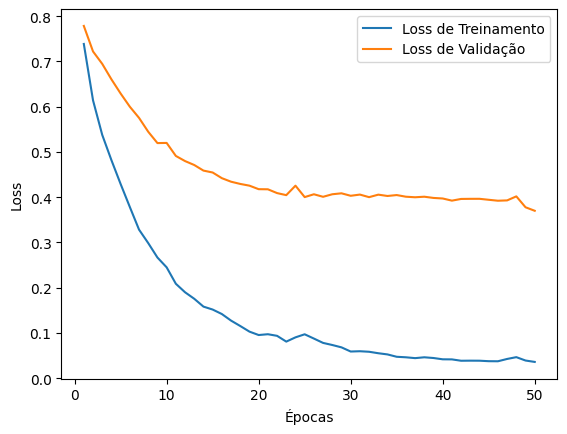

Modelo treinado!

Métricas de avaliação para DiceLoss:
	Mean Dice Coefficient: 0.7736
	Mean Jaccard Index: 0.6796
	Mean Hausdorff Distance: 4.2426
	Mean Average Surface Distance: 4.9937
	Processing Time (s): 0.0162
Treinando modelo com JaccardLoss...
Época 1/50 / Loss: 0.8425 / Val Loss: 0.8677
Época 2/50 / Loss: 0.7595 / Val Loss: 0.8380
Época 3/50 / Loss: 0.7080 / Val Loss: 0.7897
Época 4/50 / Loss: 0.6437 / Val Loss: 0.7690
Época 5/50 / Loss: 0.5911 / Val Loss: 0.7499
Época 6/50 / Loss: 0.5361 / Val Loss: 0.7316
Época 7/50 / Loss: 0.5013 / Val Loss: 0.7001
Época 8/50 / Loss: 0.4454 / Val Loss: 0.6851
Época 9/50 / Loss: 0.3990 / Val Loss: 0.6683
Época 10/50 / Loss: 0.3583 / Val Loss: 0.6416
Época 11/50 / Loss: 0.3204 / Val Loss: 0.6235
Época 12/50 / Loss: 0.2836 / Val Loss: 0.6181
Época 13/50 / Loss: 0.2643 / Val Loss: 0.5979
Época 14/50 / Loss: 0.2408 / Val Loss: 0.6027
Época 15/50 / Loss: 0.2266 / Val Loss: 0.5727
Época 16/50 / Loss: 0.2185 / Val Loss: 0.5713
Época 17/50 / Loss: 0.

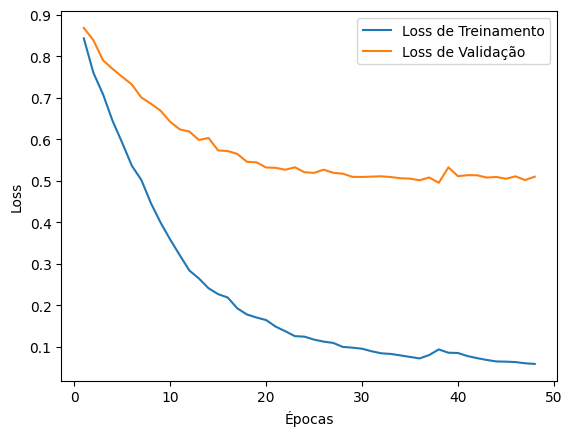

Modelo treinado!

Métricas de avaliação para JaccardLoss:
	Mean Dice Coefficient: 0.7726
	Mean Jaccard Index: 0.6830
	Mean Hausdorff Distance: 4.0471
	Mean Average Surface Distance: 7.6722
	Processing Time (s): 0.0133


In [18]:
preprocess_input = get_preprocessing_fn('xception', pretrained='imagenet')

# Definição das funções de perda
for loss_name, loss_fn in loss_functions.items():
    print(f"Treinando modelo com {loss_name}...")
    
    # Inicializa o modelo
    model = smp.Unet(
        encoder_name="xception",
        encoder_weights="imagenet",
        in_channels=1,
        classes=1,
    ).to(DEVICE)
    
    # Inicializa o otimizador
    optimizer = optim.Adam(model.parameters(), lr=1e-4)
    
    # Define o caminho para salvar o modelo
    model_path = os.path.join(MODELS_PATH, f"xception_unet_{loss_name.lower()}_model.pth")
    
    if os.path.exists(model_path):
        model.load_state_dict(torch.load(model_path))
        print("Modelo carregado!")
    else:
        # Define os data loaders
        train_loader = DataLoader(
            train_dataset,
            batch_size=BATCH_SIZE,
            pin_memory=True,
            shuffle=True,
            drop_last=False,
            num_workers=N_WORKERS
        )
    
        val_loader = DataLoader(
            val_dataset,
            batch_size=BATCH_SIZE,
            pin_memory=True,
            shuffle=False,
            drop_last=False,
            num_workers=N_WORKERS
        )
        
        # Treina o modelo
        train(model, train_loader, val_loader, loss_fn, optimizer, N_EPOCHS)
        
        # Salva o modelo treinado
        save_model(model, model_path)
        print("Modelo treinado!")
    
    # Carrega o data loader de teste
    test_loader = DataLoader(
        test_dataset,
        batch_size=BATCH_SIZE,
        pin_memory=True,
        shuffle=False,
        drop_last=False,
        num_workers=N_WORKERS
    )
    
    # Avalia o modelo
    metrics = evaluate(model, test_loader)
    print(f"\nMétricas de avaliação para {loss_name}:")
    for metric, value in metrics.items():
        print(f"\t{metric}: {value:.4f}")


# Encoder: VGG19 / Decoder: UNET

In [19]:
preprocess_input = get_preprocessing_fn('vgg19', pretrained='imagenet')

# Definição das funções de perda

for loss_name, loss_fn in loss_functions.items():
    print(f"Treinando modelo com {loss_name}...")
    
    # Inicializa o modelo
    model = smp.Unet(
        encoder_name="vgg19",
        encoder_weights="imagenet",
        in_channels=1,
        classes=1,
    ).to(DEVICE)
    
    # Inicializa o otimizador
    optimizer = optim.Adam(model.parameters(), lr=1e-4)
    
    # Define o caminho para salvar o modelo
    model_path = os.path.join(MODELS_PATH, f"vgg19_unet_{loss_name.lower()}_model.pth")
    
    if os.path.exists(model_path):
        model.load_state_dict(torch.load(model_path))
        print("Modelo carregado!")
    else:
        # Define os data loaders
        train_loader = DataLoader(
            train_dataset,
            batch_size=BATCH_SIZE,
            pin_memory=True,
            shuffle=True,
            drop_last=False,
            num_workers=N_WORKERS
        )
    
        val_loader = DataLoader(
            val_dataset,
            batch_size=BATCH_SIZE,
            pin_memory=True,
            shuffle=False,
            drop_last=False,
            num_workers=N_WORKERS
        )
        
        # Treina o modelo
        train(model, train_loader, val_loader, loss_fn, optimizer, N_EPOCHS)
        
        # Salva o modelo treinado
        save_model(model, model_path)
        print("Modelo treinado!")
    
    # Carrega o data loader de teste
    test_loader = DataLoader(
        test_dataset,
        batch_size=BATCH_SIZE,
        pin_memory=True,
        shuffle=False,
        drop_last=False,
        num_workers=N_WORKERS
    )
    
    # Avalia o modelo
    metrics = evaluate(model, test_loader)
    print(f"\nMétricas de avaliação para {loss_name}:")
    for metric, value in metrics.items():
        print(f"\t{metric}: {value:.4f}")


Treinando modelo com DiceLoss...
Época 1/50 / Loss: 0.7568 / Val Loss: 0.7752
Época 2/50 / Loss: 0.6525 / Val Loss: 0.7272
Época 3/50 / Loss: 0.5980 / Val Loss: 0.6879


KeyboardInterrupt: 

# Encoder: InceptionV4 / Decoder: UNET

Treinando modelo com DiceLoss...
Época 1/50 / Loss: 0.7572 / Val Loss: 0.7871
Época 2/50 / Loss: 0.6742 / Val Loss: 0.7559
Época 3/50 / Loss: 0.6184 / Val Loss: 0.7312
Época 4/50 / Loss: 0.5786 / Val Loss: 0.7073
Época 5/50 / Loss: 0.5394 / Val Loss: 0.6880
Época 6/50 / Loss: 0.4991 / Val Loss: 0.6705
Época 7/50 / Loss: 0.4728 / Val Loss: 0.6458
Época 8/50 / Loss: 0.4301 / Val Loss: 0.6389
Época 9/50 / Loss: 0.3988 / Val Loss: 0.6101
Época 10/50 / Loss: 0.3612 / Val Loss: 0.5889
Época 11/50 / Loss: 0.3288 / Val Loss: 0.5594
Época 12/50 / Loss: 0.3077 / Val Loss: 0.5681
Época 13/50 / Loss: 0.2903 / Val Loss: 0.5365
Época 14/50 / Loss: 0.2548 / Val Loss: 0.5126
Época 15/50 / Loss: 0.2537 / Val Loss: 0.4989
Época 16/50 / Loss: 0.2248 / Val Loss: 0.4930
Época 17/50 / Loss: 0.1995 / Val Loss: 0.4706
Época 18/50 / Loss: 0.1824 / Val Loss: 0.4668
Época 19/50 / Loss: 0.1671 / Val Loss: 0.4561
Época 20/50 / Loss: 0.1543 / Val Loss: 0.4424
Época 21/50 / Loss: 0.1448 / Val Loss: 0.4295
Época 22/5

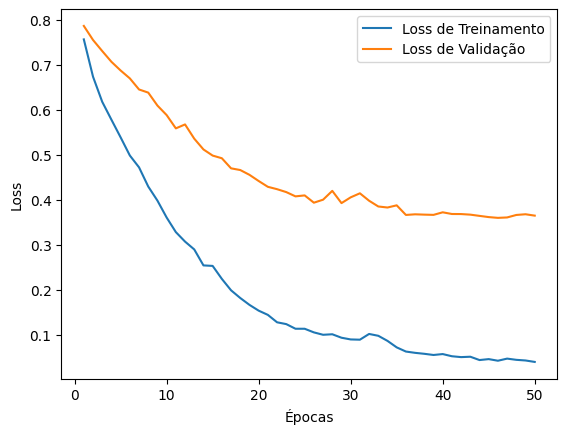

Modelo treinado!

Métricas de avaliação para DiceLoss:
	Mean Dice Coefficient: 0.7688
	Mean Jaccard Index: 0.6862
	Mean Hausdorff Distance: 3.9483
	Mean Average Surface Distance: 6.3751
	Processing Time (s): 0.0456
Treinando modelo com JaccardLoss...
Época 1/50 / Loss: 0.8614 / Val Loss: 0.8746
Época 2/50 / Loss: 0.7806 / Val Loss: 0.8544
Época 3/50 / Loss: 0.7337 / Val Loss: 0.8238
Época 4/50 / Loss: 0.6740 / Val Loss: 0.7976
Época 5/50 / Loss: 0.6359 / Val Loss: 0.7827
Época 6/50 / Loss: 0.5874 / Val Loss: 0.7644
Época 7/50 / Loss: 0.5590 / Val Loss: 0.7274
Época 8/50 / Loss: 0.5010 / Val Loss: 0.7219
Época 9/50 / Loss: 0.4557 / Val Loss: 0.6929
Época 10/50 / Loss: 0.4250 / Val Loss: 0.6672
Época 11/50 / Loss: 0.3709 / Val Loss: 0.6526
Época 12/50 / Loss: 0.3517 / Val Loss: 0.6408
Época 13/50 / Loss: 0.3117 / Val Loss: 0.6315
Época 14/50 / Loss: 0.2872 / Val Loss: 0.6083
Época 15/50 / Loss: 0.2643 / Val Loss: 0.5929
Época 16/50 / Loss: 0.2485 / Val Loss: 0.5876
Época 17/50 / Loss: 0.

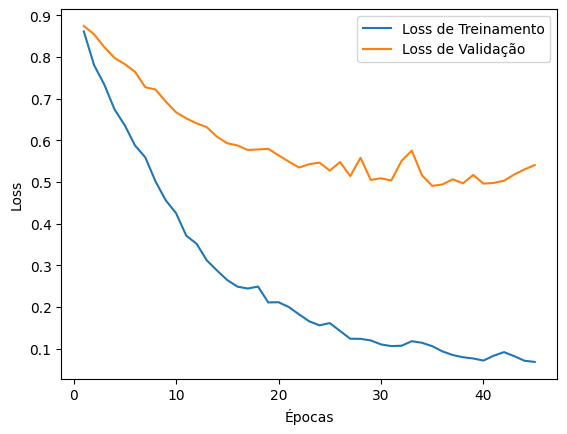

Modelo treinado!

Métricas de avaliação para JaccardLoss:
	Mean Dice Coefficient: 0.7557
	Mean Jaccard Index: 0.6765
	Mean Hausdorff Distance: 3.9910
	Mean Average Surface Distance: 6.7204
	Processing Time (s): 0.0402


In [20]:
preprocess_input = get_preprocessing_fn('inceptionv4', pretrained='imagenet+background')

for loss_name, loss_fn in loss_functions.items():
    print(f"Treinando modelo com {loss_name}...")
    
    # Inicializa o modelo
    model = smp.Unet(
        encoder_name="inceptionv4",
        encoder_weights="imagenet+background",
        in_channels=1,
        classes=1,
    ).to(DEVICE)
    
    # Inicializa o otimizador
    optimizer = optim.Adam(model.parameters(), lr=1e-4)
    
    # Define o caminho para salvar o modelo
    model_path = os.path.join(MODELS_PATH, f"inceptionv4_unet_{loss_name.lower()}_model.pth")
    
    if os.path.exists(model_path):
        model.load_state_dict(torch.load(model_path))
        print("Modelo carregado!")
    else:
        # Define os data loaders
        train_loader = DataLoader(
            train_dataset,
            batch_size=BATCH_SIZE,
            pin_memory=True,
            shuffle=True,
            drop_last=False,
            num_workers=N_WORKERS
        )
    
        val_loader = DataLoader(
            val_dataset,
            batch_size=BATCH_SIZE,
            pin_memory=True,
            shuffle=False,
            drop_last=False,
            num_workers=N_WORKERS
        )
        
        # Treina o modelo
        train(model, train_loader, val_loader, loss_fn, optimizer, N_EPOCHS)
        
        # Salva o modelo treinado
        save_model(model, model_path)
        print("Modelo treinado!")
    
    # Carrega o data loader de teste
    test_loader = DataLoader(
        test_dataset,
        batch_size=BATCH_SIZE,
        pin_memory=True,
        shuffle=False,
        drop_last=False,
        num_workers=N_WORKERS
    )
    
    # Avalia o modelo
    metrics = evaluate(model, test_loader)
    print(f"\nMétricas de avaliação para {loss_name}:")
    for metric, value in metrics.items():
        print(f"\t{metric}: {value:.4f}")


# Imagens

Carregando modelo: densenet201_unet_diceloss_model.pth


/tmp/ipykernel_65449/1237890521.py:34: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


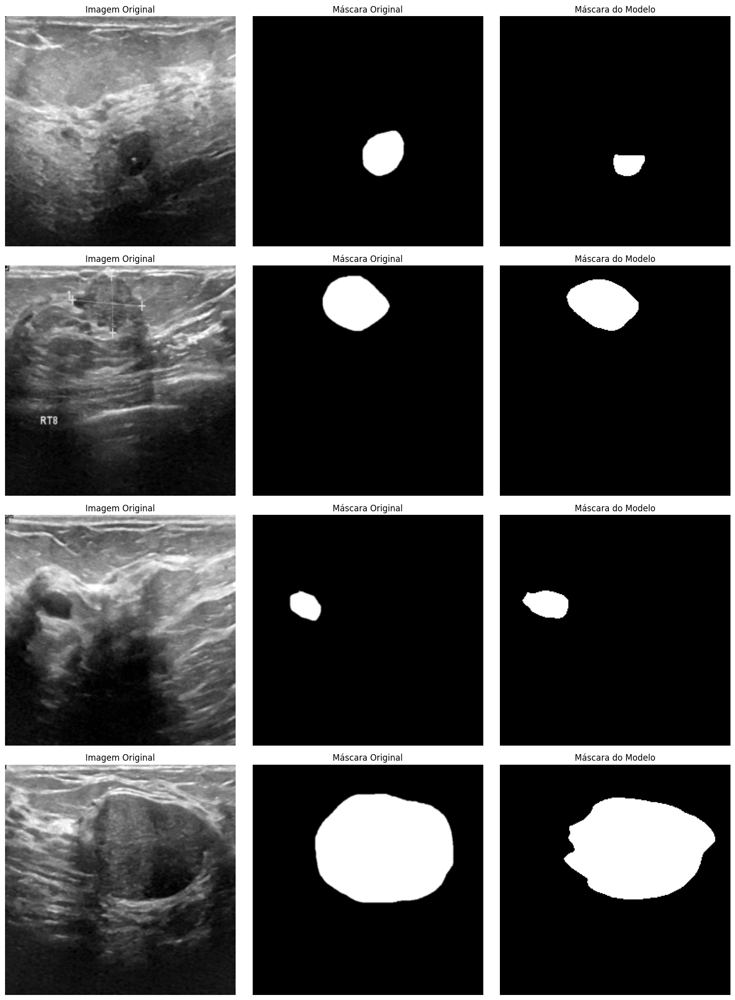

Carregando modelo: xception_unet_diceloss_model.pth


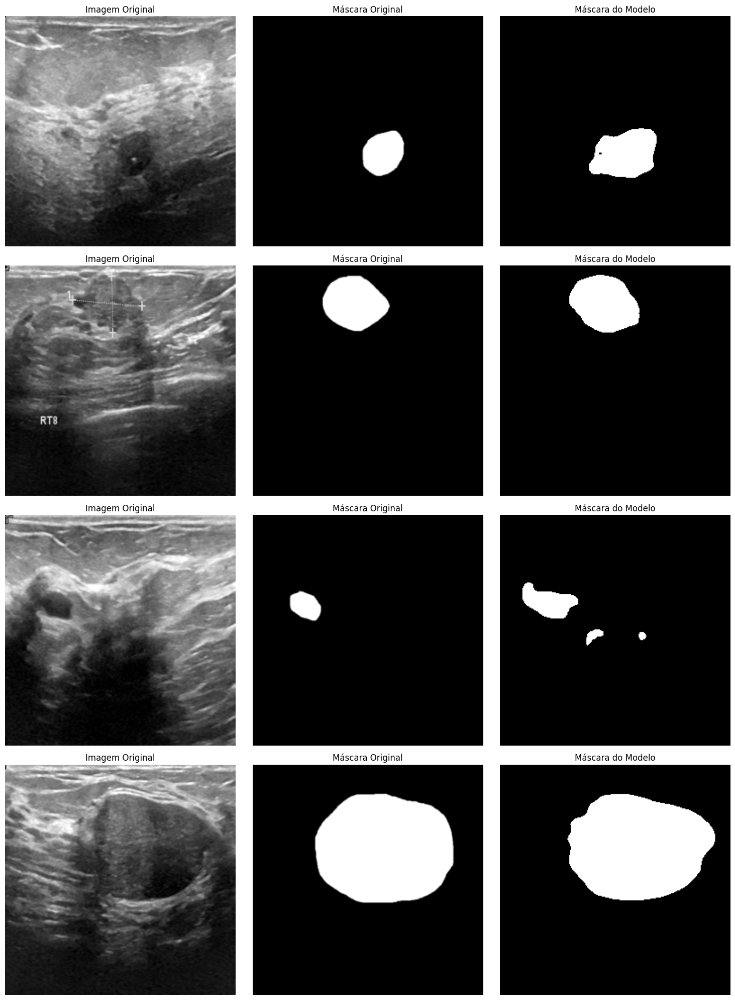

Carregando modelo: resnet152_unet_jaccardloss_model.pth


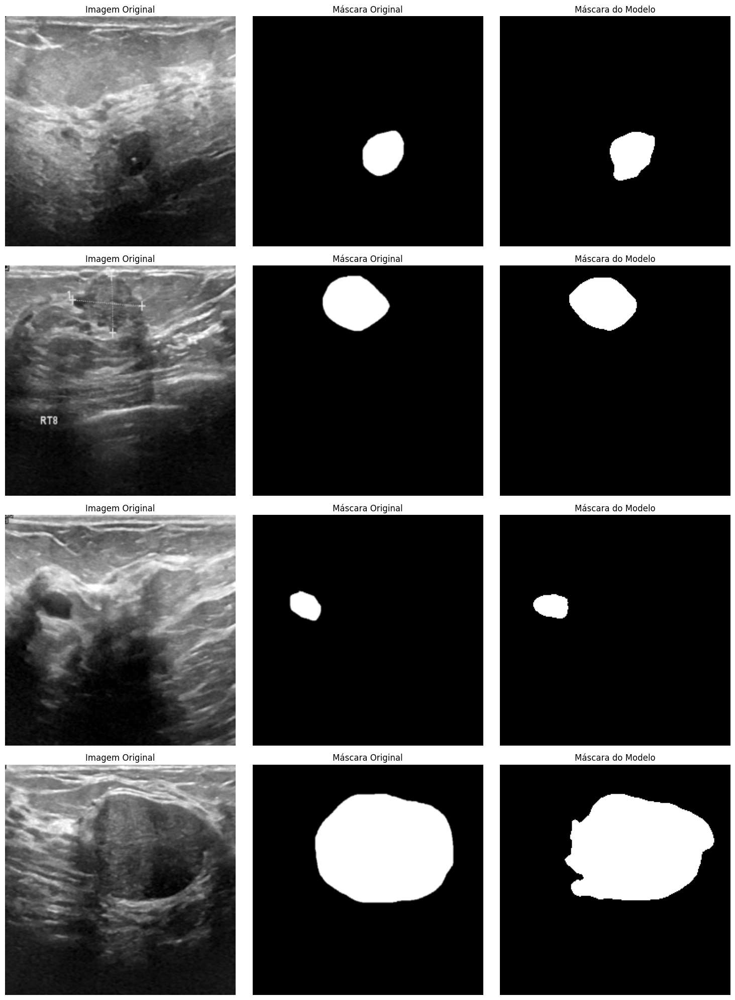

Carregando modelo: mobilenet_v2_unet_diceloss_model.pth


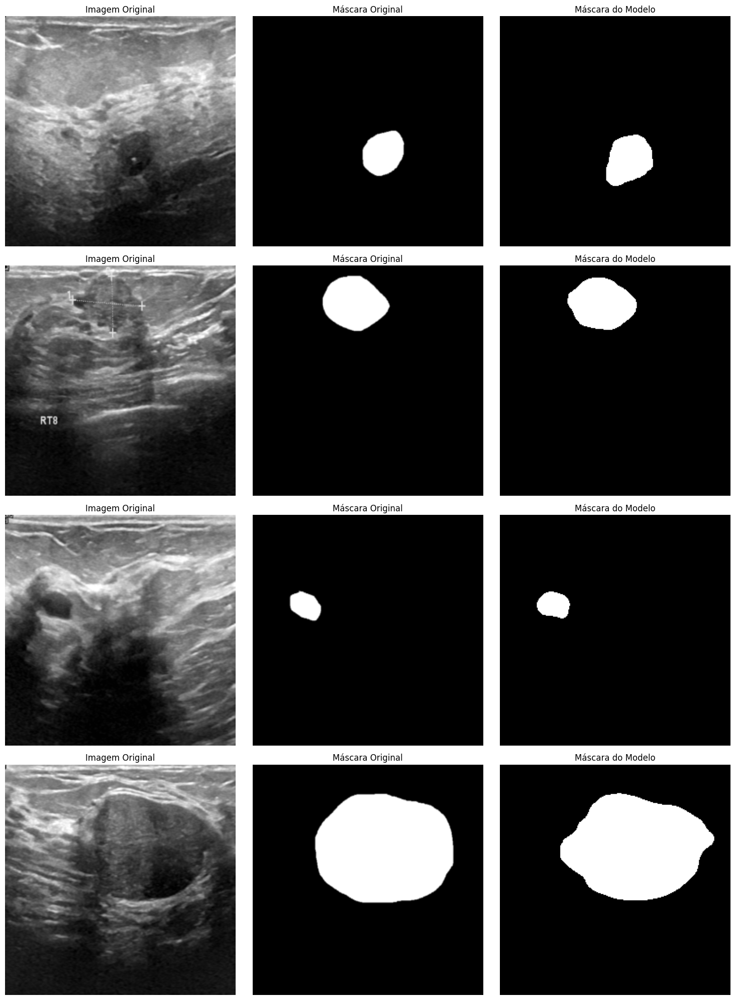

Carregando modelo: mobilenet_v2_unet_jaccardloss_model.pth


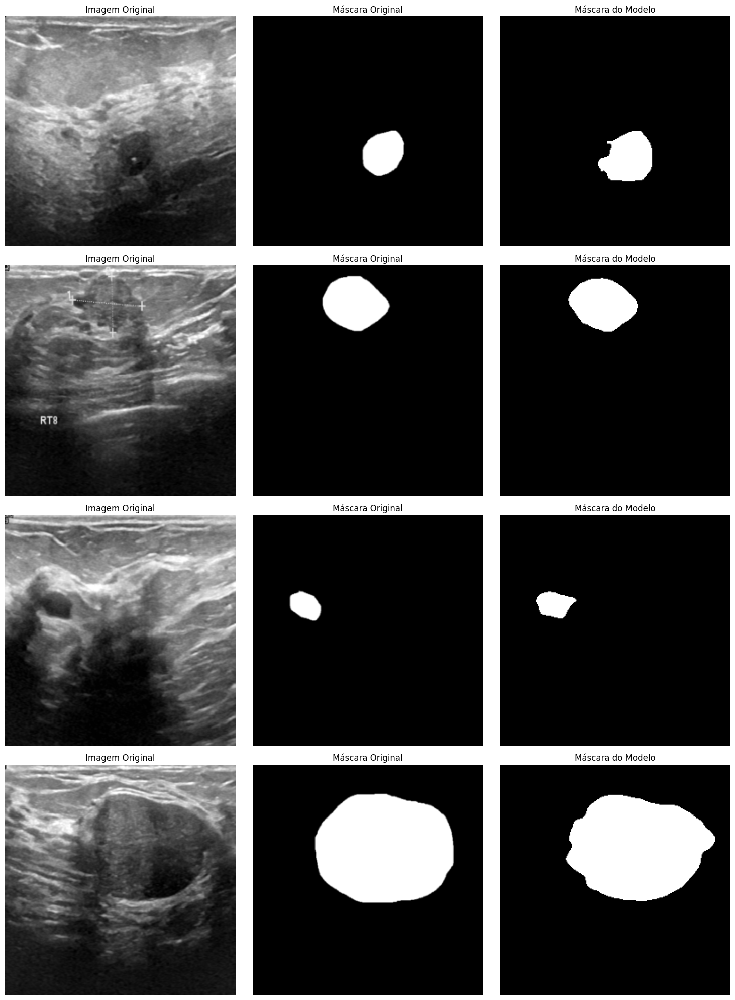

Carregando modelo: inceptionv4_unet_jaccardloss_model.pth


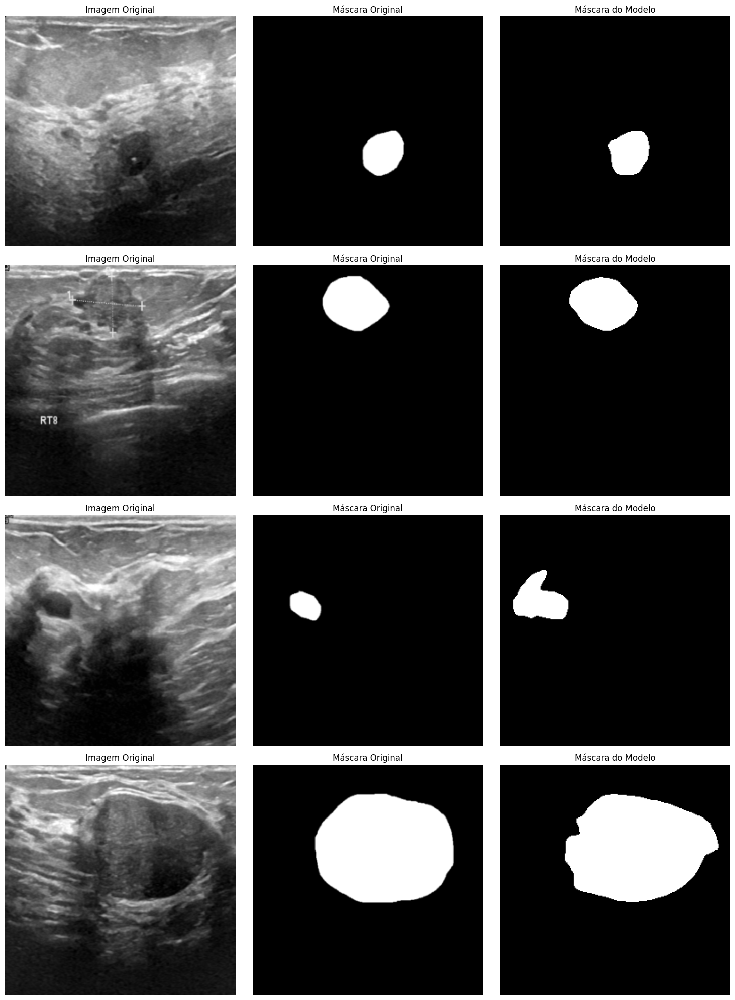

Carregando modelo: densenet201_unet_jaccardloss_model.pth


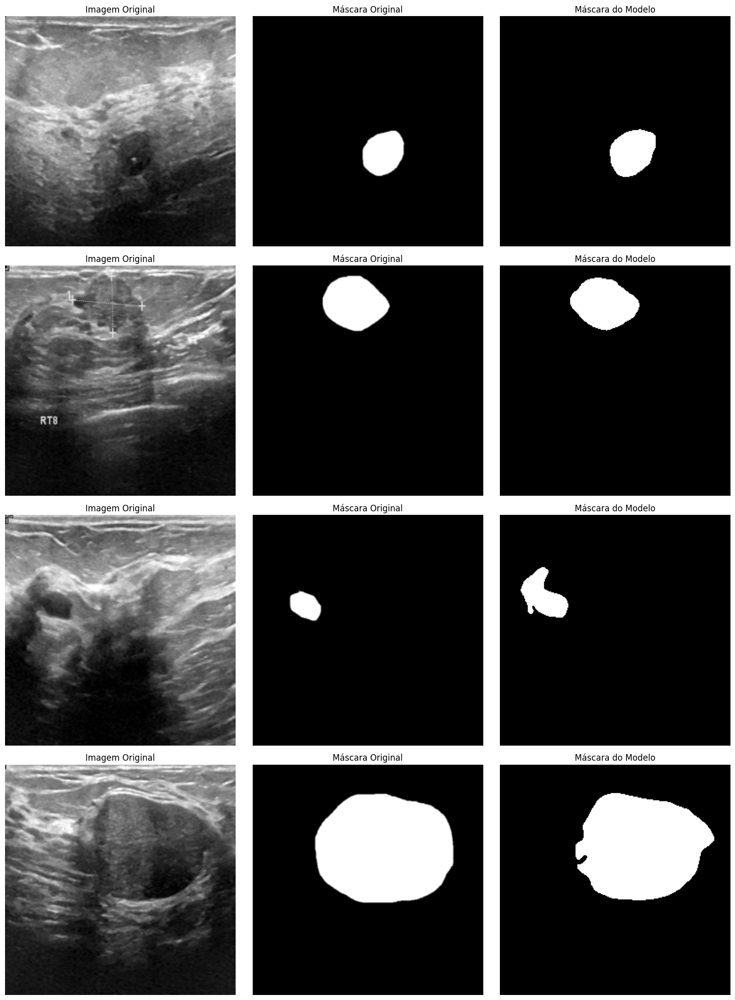

Carregando modelo: vgg19_unet_diceloss_model.pth


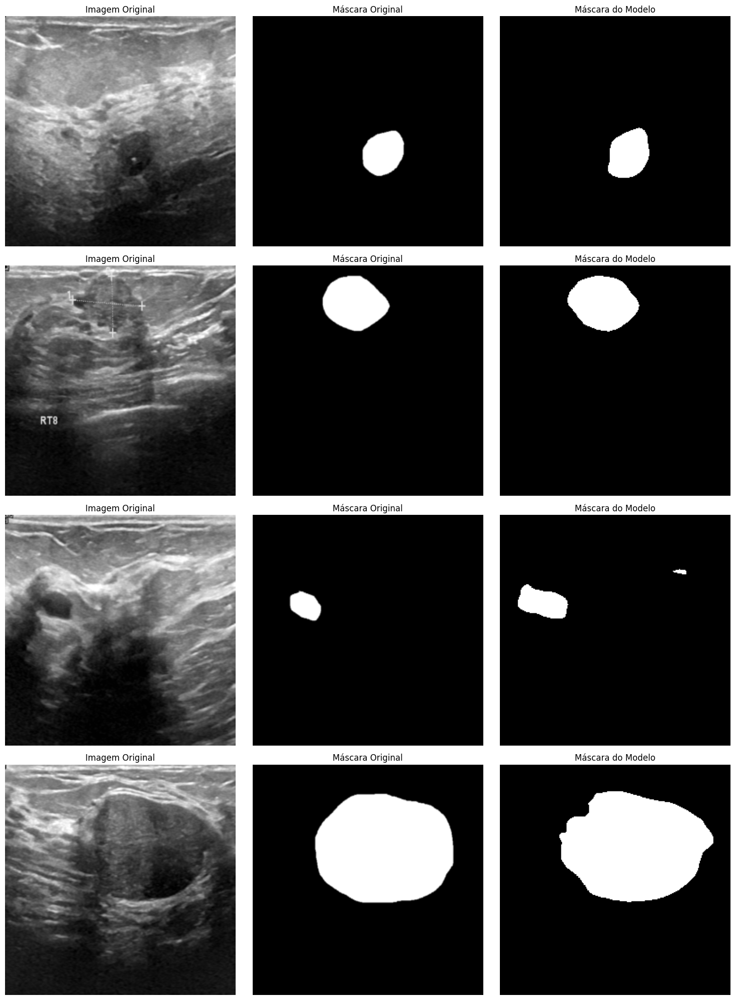

Carregando modelo: xception_unet_jaccardloss_model.pth


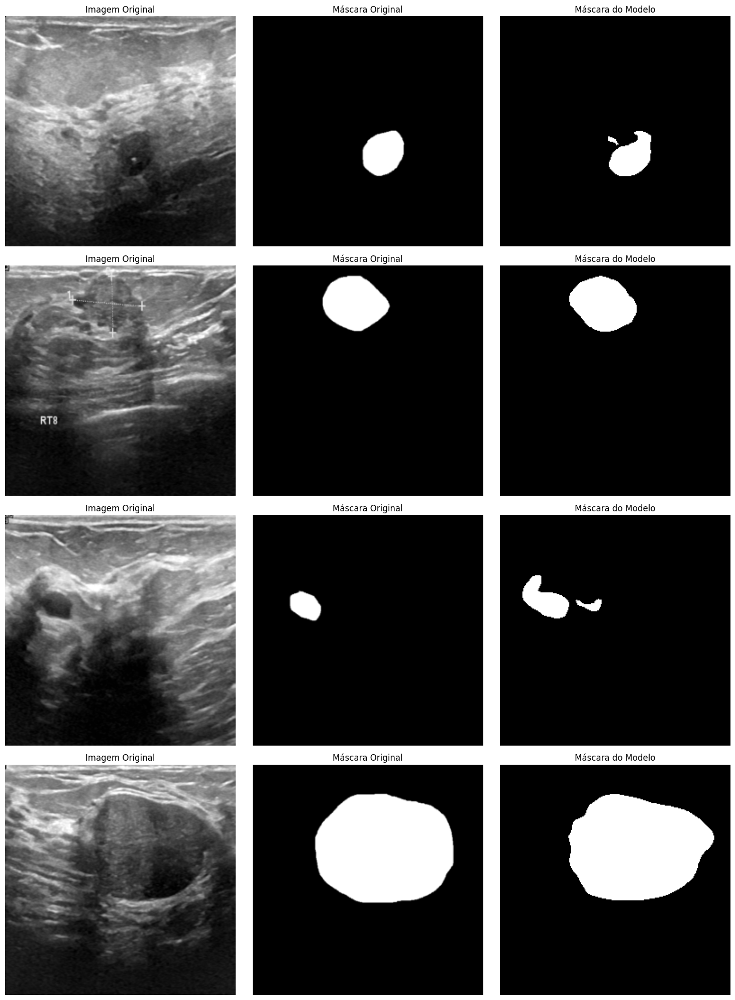

Carregando modelo: resnet152_unet_diceloss_model.pth


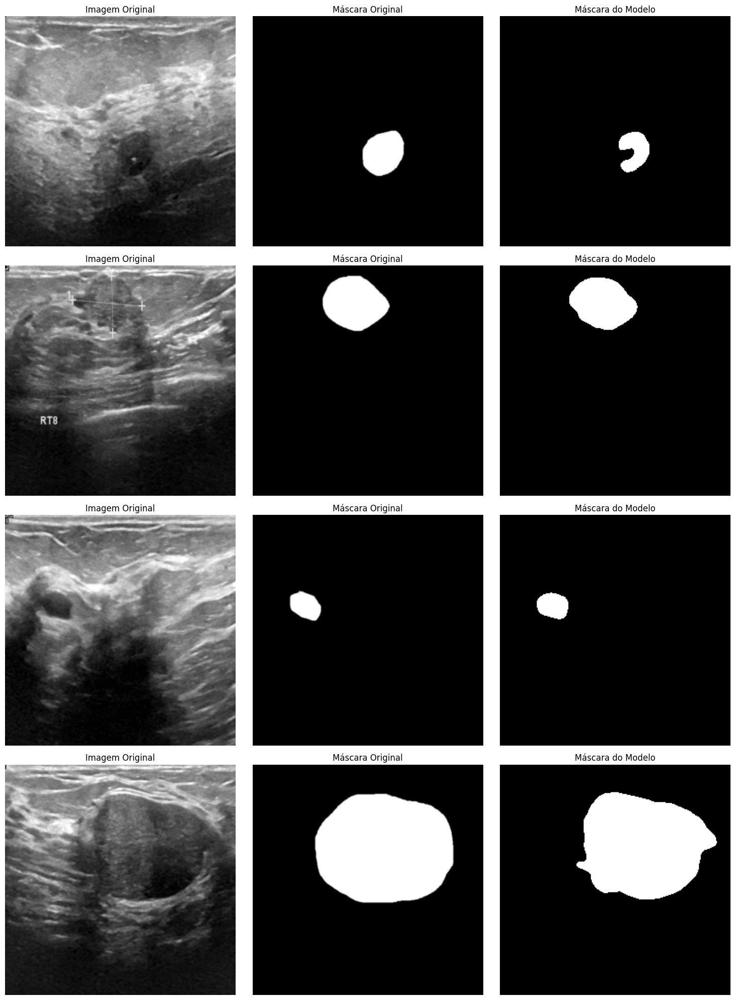

Carregando modelo: inceptionv4_unet_diceloss_model.pth


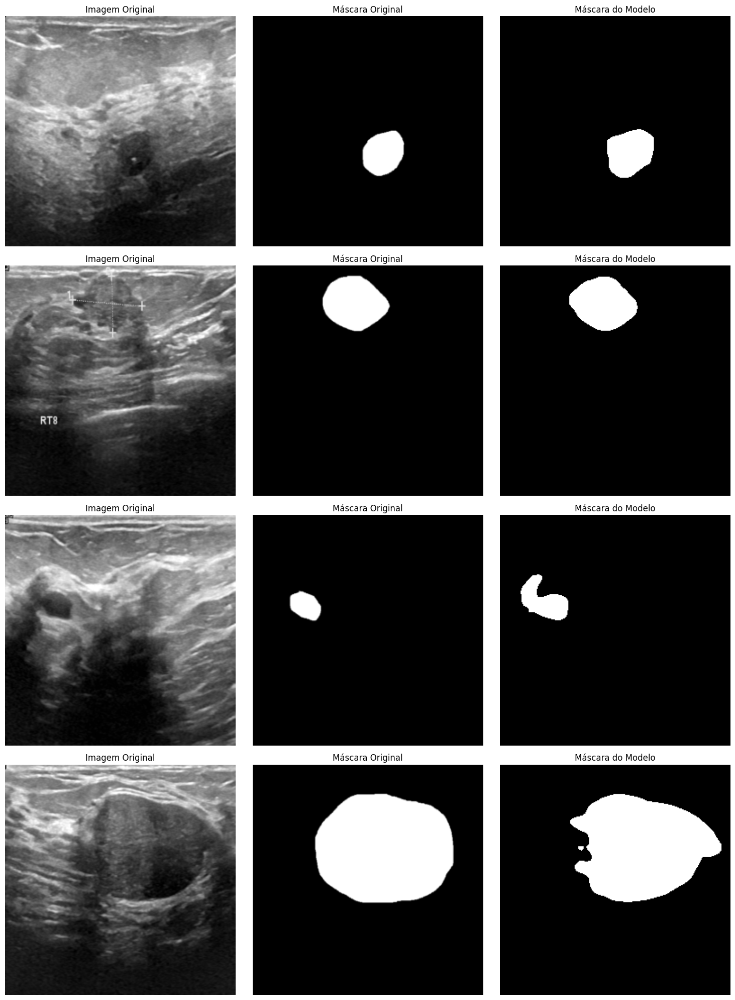

In [27]:
import matplotlib.pyplot as plt
import torch
import os
import segmentation_models_pytorch as smp

# Função para carregar o modelo com base no nome do arquivo
def load_model(model_path):
    """
    Carrega o modelo a partir do caminho fornecido.
    
    Parameters:
        model_path (str): Caminho para o arquivo do modelo.
    
    Returns:
        torch.nn.Module: Modelo carregado com os pesos.
    """
    # Extrai o nome do encoder a partir do nome do arquivo
    basename = os.path.basename(model_path)
    # Supõe que o formato do nome é 'encoder_unet_loss_model.pth'
    encoder_name = basename.split('_unet')[0]
    
    # Define os pesos do encoder
    encoder_weights = "imagenet+background" if encoder_name == "inceptionv4" else "imagenet"
    
    # Inicializa o modelo com o encoder correspondente
    model = smp.Unet(
        encoder_name=encoder_name,
        encoder_weights=encoder_weights,
        in_channels=1,
        classes=1,
    ).to(DEVICE)
    
    # Carrega o state_dict
    model.load_state_dict(torch.load(model_path))
    model.eval()
    return model

# Função para plotar imagens comparando original, máscara original e máscara do modelo
def plot_comparisons(model, test_loader, num_images=4):
    """
    Plota comparações entre imagens originais, máscaras verdadeiras e máscaras previstas pelo modelo.
    
    Parameters:
        model (torch.nn.Module): Modelo treinado.
        test_loader (torch.utils.data.DataLoader): DataLoader para o conjunto de teste.
        num_images (int): Número de imagens a serem plotadas.
    """
    fig, axes = plt.subplots(num_images, 3, figsize=(15, 5 * num_images))

    model.eval()
    
    for i, (images, masks) in enumerate(test_loader):
        if i >= num_images:
            break
        with torch.no_grad():
            images = images.to(DEVICE)
            outputs = model(images)
            preds = torch.sigmoid(outputs) > 0.5  # Aplicando limiar de 0.5
        
        # Imagem original
        axes[i, 0].imshow(images[0].cpu().numpy().squeeze(), cmap='gray')
        axes[i, 0].set_title("Imagem Original")
        axes[i, 0].axis('off')
        
        # Máscara original
        axes[i, 1].imshow(masks[0].cpu().numpy().squeeze(), cmap='gray')
        axes[i, 1].set_title("Máscara Original")
        axes[i, 1].axis('off')
        
        # Máscara do modelo
        axes[i, 2].imshow(preds[0].cpu().numpy().squeeze(), cmap='gray')
        axes[i, 2].set_title("Máscara do Modelo")
        axes[i, 2].axis('off')
    
    plt.tight_layout()
    plt.show()

# Caminho para a pasta de modelos
model_dir = 'models/segmentation_metrics'

# Itera sobre cada modelo na pasta e plota as comparações
for model_file in os.listdir(model_dir):
    model_path = os.path.join(model_dir, model_file)
    print(f"Carregando modelo: {model_file}")
    model = load_model(model_path)
    plot_comparisons(model, test_loader)